# Prepare the Colab Notebook 


In [0]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:

%ls

 dataset_dicts.json                       IMG_20200131_132014.jpg
 demonstration0.jpg                       IMG_20200131_132015.jpg
 demonstration1.jpg                       IMG_20200131_132044.jpg
 demonstration2.jpg                       IMG_20200131_132047.jpg
 demonstration.jpg                        IMG_20200131_132048.jpg
 detectron2_repo/                         IMG_20200131_132112.jpg
'images of the result'/                   IMG_20200131_132114.jpg
'IMG_20200131_123108 - Copy.jpg'          IMG_20200131_132116.jpg
 IMG_20200131_123108.jpg                  IMG_20200131_132118.jpg
'IMG_20200131_123116 - Copy.jpg'          IMG_20200131_132121.jpg
 IMG_20200131_123116.jpg                  IMG_20200131_132140.jpg
'IMG_20200131_123225 - Copy.jpg'          IMG_20200131_132146.jpg
 IMG_20200131_123225.jpg                  IMG_20200131_132148.jpg
'IMG_20200131_123228 - Copy.jpg'          IMG_20200131_132201.jpg
 IMG_20200131_123228.jpg                  IMG_20200131_132202.jpg
'IMG_20200

In [0]:

%cd drive/My Drive/object detection

[Errno 2] No such file or directory: 'drive/My Drive/object detection'
/content/drive/My Drive/object detection


# Install dependencies

In [0]:
# install dependencies:
# (use +cu100 because colab is on CUDA 10.0)
!pip install -U torch==1.4+cu100 torchvision==0.5+cu100 -f https://download.pytorch.org/whl/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

torch.__version__
!gcc --version
# opencv is pre-installed on colab

Looking in links: https://download.pytorch.org/whl/torch_stable.html
Requirement already up-to-date: torch==1.4+cu100 in /usr/local/lib/python3.6/dist-packages (1.4.0+cu100)
Requirement already up-to-date: torchvision==0.5+cu100 in /usr/local/lib/python3.6/dist-packages (0.5.0+cu100)
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-2x8ccdjl
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-2x8ccdjl
  Created wheel for pycocotools: filename=pycocotools-2.0-cp36-cp36m-linux_x86_64.whl size=275247 sha256=7bcba894960d3f1cc152d748615158ea076a3e979f317800a0cf2b7146f26e61
  Stored in directory: /tmp/pip-ephem-wheel-cache-tgb3_bkw/wheels/90/51/41/646daf401c3bc408ff10de34ec76587a9b3ebfac8d21ca5c3a
Successfully built pycocotools
  Found existing installation: pycocotools 2.0
    Uninstalling pycocotools-2.0:
      Successfully uninstalled pycocotools-2.0


gcc (Ubuntu 7.4.0-1ubuntu1~18.04.1) 7.4.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [0]:
# install detectron2:
#!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -e detectron2_repo

You have to restart your runtime prior to this, to let your installation take effect

In [0]:
# Some basic setup:
# Setup detectron2 logger
import torch, torchvision
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

# Preparation for Training

Converting the annotations into the format required by detectron2

In [0]:
import os
import numpy as np
import json
from detectron2.structures import BoxMode
import itertools
import xml.dom.minidom

name_list=[]

def get_dicts(directory):
  dataset_dicts = []
  y=0
  for file in os.listdir(directory):
    filename = os.fsdecode(file)
    print(str(y)+"files seen so far")
    y=y+1
    if filename.endswith(".xml"):
      #print(directory)
      filename = directory+"/"+filename
      #print(filename)
      doc = xml.dom.minidom.parse(filename)
      record = {}
      #print(filename)
      filename = "."+filename.strip(".xml")+".jpg"
      #print(filename)
      height, width = cv2.imread(filename).shape[:2]
      record["file_name"] = filename
      record["height"] = height
      record["width"] = width
      
      # getting the category  ids ready
      nams = doc.getElementsByTagName('name')
      
      for nam in nams:
        name = nam.firstChild.nodeValue
        if not name in name_list:
          name_list.append(name)
      xmx = doc.getElementsByTagName('xmax')      
      xmn = doc.getElementsByTagName('xmin')
      ymx = doc.getElementsByTagName('ymax')
      ymn = doc.getElementsByTagName('ymin')
      
      objs = []
      i=0
      for nam in nams:
        name = nam.firstChild.nodeValue
        xmax = float(xmx[i].firstChild.nodeValue)
        xmin = float(xmn[i].firstChild.nodeValue)
        ymax = float(ymx[i].firstChild.nodeValue)
        ymin = float(ymn[i].firstChild.nodeValue)
        i = i+1
        
        poly = [(x + 0.5, y + 0.5) for x, y in [(xmin,ymin),(xmin,ymax),(xmax,ymin),(xmax,ymax)]]
        poly = list(itertools.chain.from_iterable(poly))
        
        obj = {
            "bbox": [xmin, ymin, xmax, ymax],
            "bbox_mode": BoxMode.XYXY_ABS,
            "segmentation": [poly],
            "category_id": name_list.index(name),
            "iscrowd": 0
        }      
        objs.append(obj)
      record["annotations"] = objs
      dataset_dicts.append(record)
  return dataset_dicts

from detectron2.data import DatasetCatalog, MetadataCatalog
for d in ["train", "val"]:
    DatasetCatalog.register("./" + d, lambda d=d: get_dicts("./" + d))
    MetadataCatalog.get("./" + d).set(thing_classes=name_list)
train_metadata = MetadataCatalog.get("./train")

#name_list=['Idol(s)','Flower(s)','Debris','Plastic(s)']

checking whether the annotations are proper by viewing the annotations of randomly selected images from the training set

done here
0files seen so far
1files seen so far
2files seen so far
3files seen so far
4files seen so far
5files seen so far
6files seen so far
7files seen so far
8files seen so far
9files seen so far
10files seen so far
11files seen so far
12files seen so far
13files seen so far
14files seen so far
15files seen so far
16files seen so far
17files seen so far
18files seen so far
19files seen so far
20files seen so far
21files seen so far
22files seen so far
23files seen so far
24files seen so far
25files seen so far
26files seen so far
27files seen so far
28files seen so far
29files seen so far
30files seen so far
31files seen so far
32files seen so far
33files seen so far
34files seen so far
35files seen so far
36files seen so far
37files seen so far
38files seen so far
39files seen so far
40files seen so far
41files seen so far
42files seen so far
43files seen so far
44files seen so far
45files seen so far
46files seen so far
47files seen so far
48files seen so far
49files seen so far


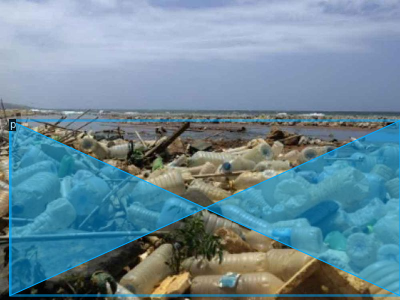

2


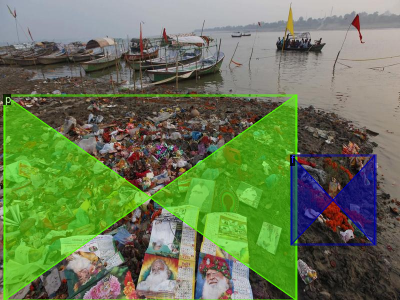

3


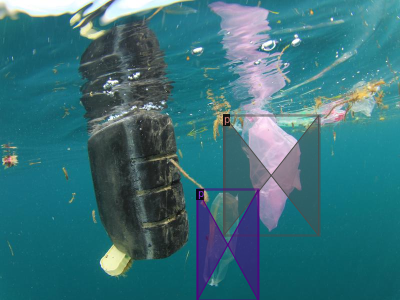

In [0]:
'''import random
n=0
print("done here")
dataset_dicts = get_dicts("./train")
for d in random.sample(dataset_dicts, 3):
    #print(d["file_name"])
    n=n+1
    print(n)
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    i=vis.get_image()[:, :, ::-1]
    cv2_imshow(i)'''


import random
n=0
j=0
print("done here")
dataset_dicts = get_dicts("./train")
for d in random.sample(dataset_dicts, 3):
    #print(d["file_name"])
    n=n+1
    print(n)
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    i=vis.get_image()[:, :, ::-1]
    cv2.imwrite('demonstration'+str(j)+'.jpg',i)
    j+=1
    cv2_imshow(i)

In [0]:
name_list=['idol','plastic','plastic','flower']
print(name_list)

['idol', 'plastic', 'plastic', 'flower']


In [0]:
# save the dataset_dicts
import json
with open('dataset_dicts.json', 'w') as outfile:
    json.dump(dataset_dicts, outfile)

In [0]:
# reading the dataset_dicts
import json
with open('dataset_dicts.json') as json_file:
    dataset_dicts = json.load(json_file)

# Train!

We will train and save the weights into "./output/model_final.pth" file, which we can use for testing in other notebooks or PCs


Now, let's fine-tune a coco-pretrained R50-FPN Mask R-CNN model on our dataset. It takes ~6 minutes to train 300 iterations on Colab's K80 GPU, or ~2 minutes on a P100 GPU.

In [0]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("./train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 600    # 300 iterations seems good enough for this toy dataset; you may need to train longer for a practical dataset
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 32   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4  # only has one class (ballon)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)    # save the trained weights into the OUTPUT_DIR = "./output/model_final.pth"
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[02/02 09:00:20 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

'roi_heads.box_predictor.cls_score.weight' has shape (81, 1024) in the checkpoint but (5, 1024) in the model! Skipped.
'roi_heads.box_predictor.cls_score.bias' has shape (81,) in the checkpoint but (5,) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.weight' has shape (320, 1024) in the checkpoint but (16, 1024) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.bias' has shape (320,) in the checkpoint but (16,) in the model! Skipped.
'roi_heads.mask_head.predictor.weight' has shape (80, 256, 1, 1) in the checkpoint but (4, 256, 1, 1) in the model! Skipped.
'roi_heads.mask_head.predictor.bias' has shape (80,) in the checkpoint but (4,) in the model! Skipped.


[02/02 09:00:24 d2.engine.train_loop]: Starting training from iteration 0
[02/02 09:00:32 d2.utils.events]: eta: 0:03:46  iter: 19  total_loss: 3.097  loss_cls: 1.528  loss_box_reg: 0.810  loss_mask: 0.694  loss_rpn_cls: 0.034  loss_rpn_loc: 0.012  time: 0.3929  data_time: 0.0143  lr: 0.000005  max_mem: 2335M
[02/02 09:00:40 d2.utils.events]: eta: 0:03:34  iter: 39  total_loss: 2.875  loss_cls: 1.430  loss_box_reg: 0.659  loss_mask: 0.693  loss_rpn_cls: 0.065  loss_rpn_loc: 0.014  time: 0.3867  data_time: 0.0046  lr: 0.000010  max_mem: 2335M
[02/02 09:00:48 d2.utils.events]: eta: 0:03:28  iter: 59  total_loss: 2.814  loss_cls: 1.317  loss_box_reg: 0.676  loss_mask: 0.692  loss_rpn_cls: 0.075  loss_rpn_loc: 0.014  time: 0.3896  data_time: 0.0052  lr: 0.000015  max_mem: 2335M
[02/02 09:00:55 d2.utils.events]: eta: 0:03:19  iter: 79  total_loss: 2.436  loss_cls: 1.091  loss_box_reg: 0.582  loss_mask: 0.690  loss_rpn_cls: 0.055  loss_rpn_loc: 0.010  time: 0.3868  data_time: 0.0042  lr: 0.0

In [0]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1396), started 0:00:12 ago. (Use '!kill 1396' to kill it.)

In [0]:
%reload_ext tensorboard

# Inference & evaluation using the trained model (Optional)
There is another colab notebook named "test.ipynb" where you can continue with the saved weights from here.
Or you can test the weights here itself to make sure everything is fine.
Now, let's run inference with the trained model on the the validation dataset. First, let's create a predictor using the model we just trained:



In [0]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.54   # set the testing threshold for this model
cfg.DATASETS.TEST = ("./test data iit bhu hackathon (2)/test data iit bhu hackathon/Test data", )
predictor = DefaultPredictor(cfg)

{'instances': Instances(num_instances=2, image_height=600, image_width=800, fields=[pred_boxes = Boxes(tensor([[356.7580, 289.2572, 747.7120, 516.8414],
        [ 34.5406, 228.9829, 424.6279, 497.4019]], device='cuda:0')), scores = tensor([0.7129, 0.5801], device='cuda:0'), pred_classes = tensor([0, 0], device='cuda:0'), pred_masks = tensor([[[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]],

        [[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, 

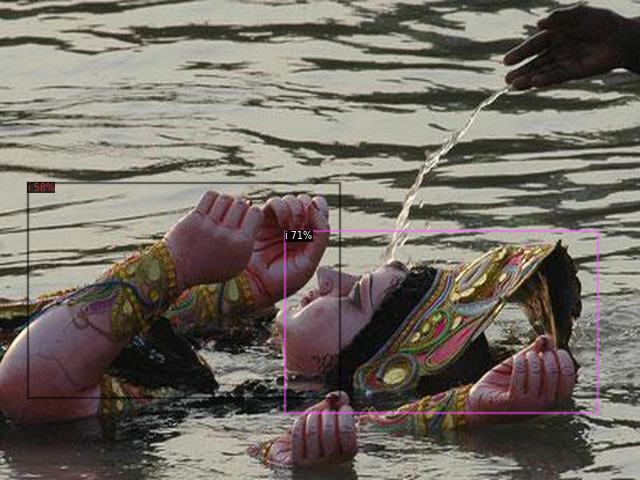

True

In [0]:
im = cv2.imread('./test/image441.jpg')   #
#cv2_imshow(im)
outputs = predictor(im)
print(outputs)
from detectron2.utils.visualizer import ColorMode
outputs = predictor(im)
v = Visualizer(im[:, :, ::-1],
                metadata=train_metadata, 
                  scale=0.8, 
                   instance_mode=ColorMode   # remove the colors of unsegmented pixels
    )
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
i=v.get_image()[:, :, ::-1]
cv2_imshow(i)
cv2.imwrite("result.jpg",i)

In [0]:
dataset_dicts='./test data iit bhu hackathon (2)/test data iit bhu hackathon/Test data'   # data iit bhu hackathon (2)/test data iit bhu hackathon/Test data'
l=os.listdir(dataset_dicts)

training_data='./train'
l_train=os.listdir(training_data)

In [0]:
l_train_img=[]
for i in l_train:
  if(i[-4:]=='.jpg'):
    l_train_img.append(i)

In [0]:
#%cd drive/My Drive/object detection/results
for d in l[20:]:
    im = cv2.imread(dataset_dicts+'/'+d)
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=train_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    i=v.get_image()[:, :, ::-1]
    #cv2_imshow(i)
    cv2.imwrite(d,i)

test on three random images from the validation set

In [0]:

from detectron2.utils.visualizer import ColorMode
#dataset_dicts = get_dicts("./test")
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=train_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

[Errno 2] No such file or directory: 'drive/My Drive/object detection/results'
/content/drive/My Drive/object detection


TypeError: ignored

In [0]:
dataset_dicts

In [0]:
import pandas as pd
df=pd.DataFrame(np.array(l),columns=['files'])
df.to_csv("result.csv")


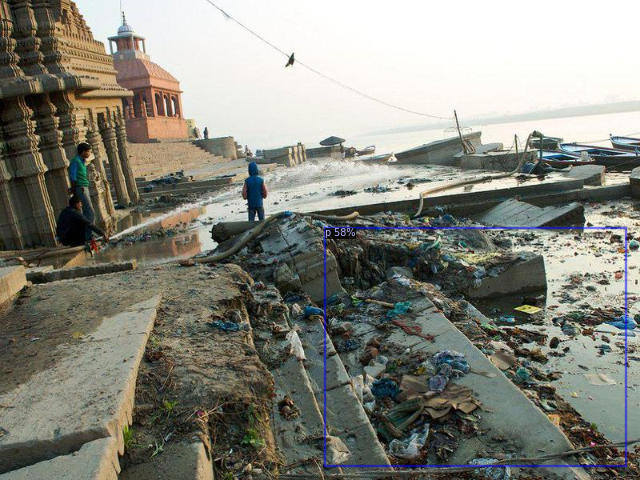

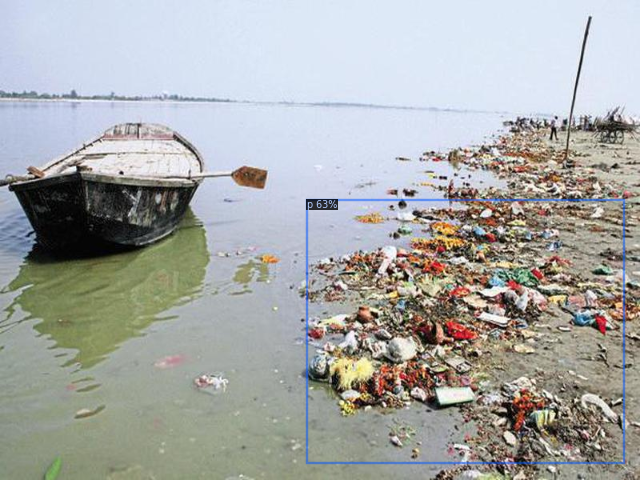

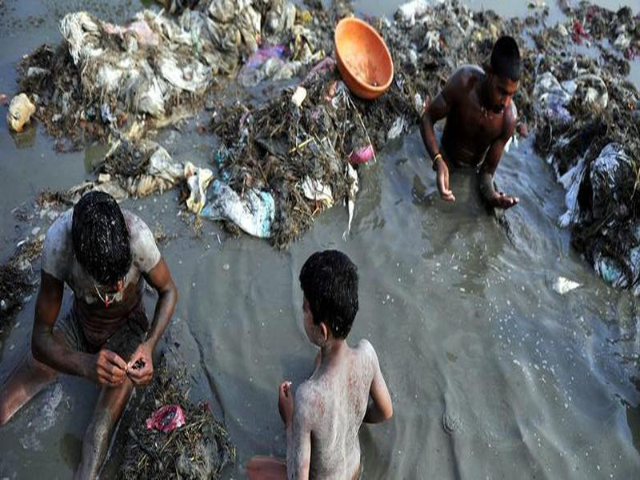

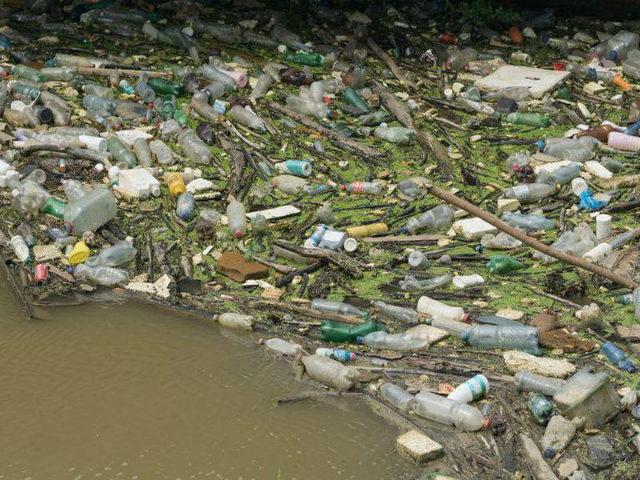

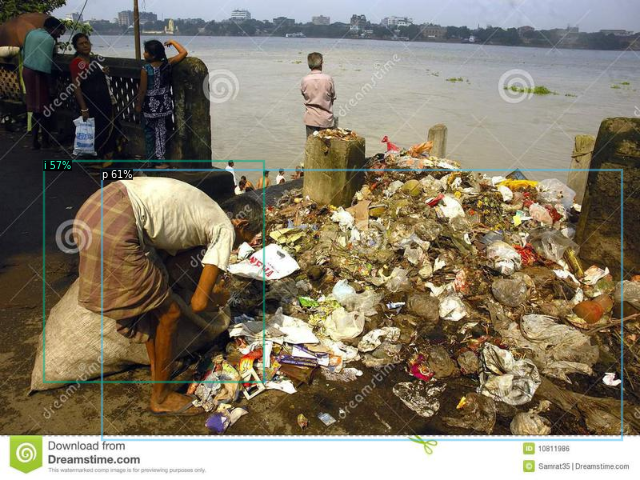

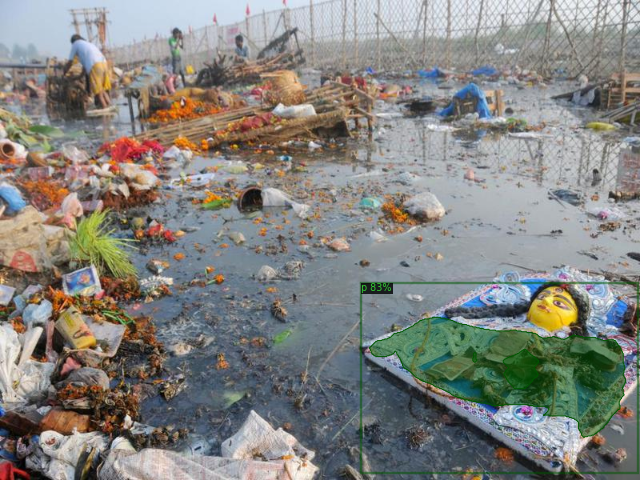

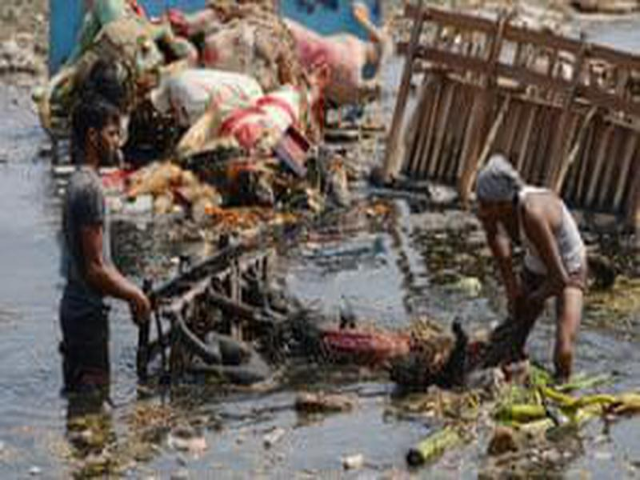

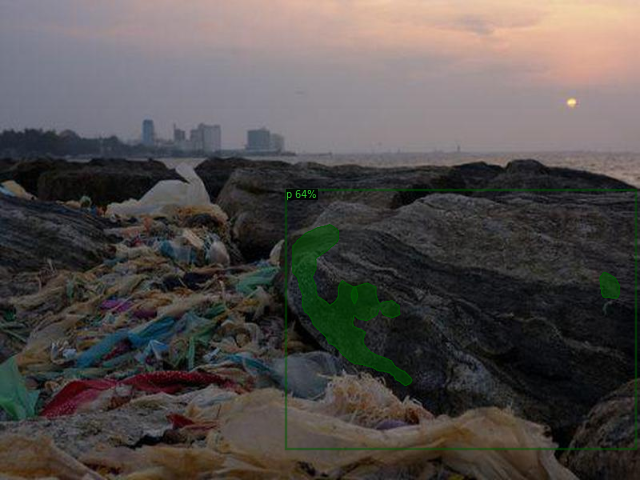

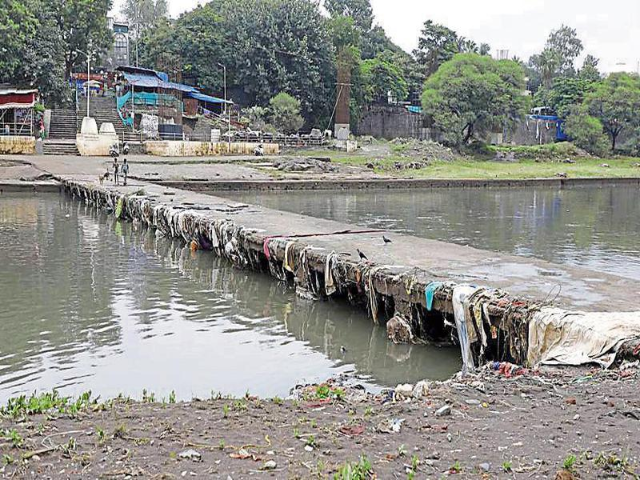

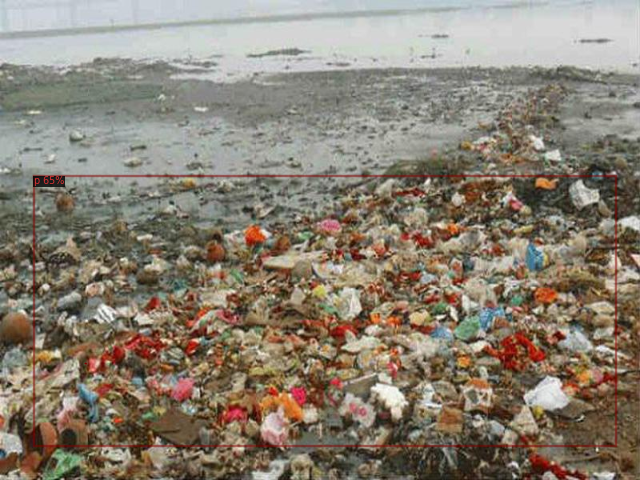

In [0]:
for d in random.sample(l_train_img,10):
  im = cv2.imread(training_data+'/'+d)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                   metadata=train_metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode   # remove the colors of unsegmented pixels
    )
  v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(v.get_image()[:, :, ::-1])


In [0]:
random.sample(l_train_img,3)

['image7.jpg', 'image150.jpg', 'image26.jpg']

In [0]:
l_train_img

['image25.jpg',
 'image205.jpg',
 'image315.jpg',
 'image100.jpg',
 'image268.jpg',
 'image392.jpg',
 'image62.jpg',
 'image210.jpg',
 'image298.jpg',
 'image10.jpg',
 'image231.jpg',
 'image20.jpg',
 'image159.jpg',
 'image27.jpg',
 'image372.jpg',
 'image373.jpg',
 'image218.jpg',
 'image5.jpg',
 'image133.jpg',
 'image171.jpg',
 'image302.jpg',
 'image351.jpg',
 'image95.jpg',
 'image236.jpg',
 'image296.jpg',
 'image198.jpg',
 'image81.jpg',
 'image317.jpg',
 'image108.jpg',
 'image92.jpg',
 'image148.jpg',
 'image64.jpg',
 'image173.jpg',
 'image123.jpg',
 'image50.jpg',
 'image333.jpg',
 'image346.jpg',
 'image59.jpg',
 'image314.jpg',
 'image70.jpg',
 'image15.jpg',
 'image113.jpg',
 'image52.jpg',
 'image282.jpg',
 'image220.jpg',
 'image377.jpg',
 'image112.jpg',
 'image51.jpg',
 'image334.jpg',
 'image82.jpg',
 'image200.jpg',
 'image132.jpg',
 'image180.jpg',
 'image235.jpg',
 'image169.jpg',
 'image208.jpg',
 'image39.jpg',
 'image305.jpg',
 'image48.jpg',
 'image292.jpg',
